#                 Gold prediction

#### Objectif : Prédire avec précision le cout de l'or 

## 1. Analyse exploratoire

In [1]:
#pip install plotly==5.3.1

In [2]:
# Importation des bibliothèques

import numpy as np
#from numpy import mean
#from numpy import std
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
#from matplotlib.pyplot import figure
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go


from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import RobustScaler

from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.svm import SVR

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

from scipy.stats import shapiro
from scipy.stats import levene
from scipy.stats import kstest

%matplotlib inline


In [3]:
# Affichage des différentes variables en entier

pd.set_option('display.max_row',100)
pd.set_option('display.max_column',81)

In [4]:
# Chargement du dataset
df = pd.read_csv('FINAL_USO.csv', sep=',', index_col='Date', parse_dates=True,infer_datetime_format=True)

In [5]:
# Affichage du dataset
df

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,105.441238,199109200,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000,74.550003,76.150002,72.150002,72.900002,70.431755,787900,1.3018,1.2982,1.3051,1.2957,1,105.09,104.88,106.50,104.88,14330,1,93.42,94.91,96.00,93.33,0,53604,54248,54248,52316,119440,1,1.911,1.911,1.911,1.911,1,1414.65,1420.30,1423.35,1376.85,0,618.85,614.70,615.00,614.60,1,1425,80.341,80.565,80.630,80.130,22850,0,53.009998,53.139999,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,105.597549,220481400,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000,73.599998,75.099998,73.349998,74.900002,72.364037,896600,1.3035,1.3020,1.3087,1.2997,1,103.35,103.51,104.56,102.46,140080,0,93.79,93.43,94.80,92.53,1,53458,53650,54030,52890,65390,0,1.851,1.851,1.851,1.851,0,1420.25,1414.75,1431.75,1400.70,1,623.65,622.60,623.45,622.30,1,1400,80.249,80.175,80.395,79.935,13150,0,52.500000,53.180000,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,104.468536,183903000,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000,69.099998,69.800003,64.199997,64.699997,62.509384,2096700,1.2995,1.3043,1.3044,1.2981,0,103.64,103.63,104.57,102.37,147880,1,94.09,93.77,94.43,92.55,1,52961,53400,53400,52544,67280,0,1.810,1.810,1.810,1.810,0,1411.10,1422.65,1427.60,1404.60,0,608.80,626.00,630.00,608.60,0,1400,80.207,80.300,80.470,80.125,970,0,52.490002,52.549999,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,107.629784,225418100,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000,66.449997,68.099998,66.000000,67.000000,64.731514,875300,1.3079,1.3003,1.3133,1.2994,1,106.73,104.30,107.27,103.91,170240,1,95.55,96.39,99.70,96.39,1,53487,52795,53575,52595,55130,1,1.927,1.927,1.927,1.927,1,1434.75,1408.95,1436.55,1408.15,1,626.65,622.45,622.45,622.45,1,1400,80.273,80.890,80.940,80.035,22950,1,52.380001,53.250000,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,107.838242,194230900,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000,67.099998,69.400002,66.900002,68.500000,66.180725,837600,1.3045,1.3079,1.3197,1.3024,0,107.71,107.15,108.17,106.16,145090,1,99.01,97.54,99.26,96.81,1,53148,53519,54184,52937,75950,0,1.970,1.970,1.970,1.970,1,1429.05,1434.40,1453.75,1417.65,0,635.90,625.70,641.50,623.80,1,1400,80.350,80.105,80.445,79.550,24140,1,53.150002,53.430000,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [6]:
# Affichage de toute les variables
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open',
       'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open',
       'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open',
       'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price',
       'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open',
       'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open',
       'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High',
       'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO

## a-Identification de la target

Le défi de ce projet est de prédire avec précision le futur cours de clôture ajusté de l'ETF sur l'or sur une période donnée dans le futur. Il s'agit donc de la variable " Gold ETF :- Adjusted Close "

## b-Nombre de ligne et de colonnes

In [7]:
df.shape

(1718, 80)

### Il y a 1718 lignes et 80 colonnes

## c- Identification des valeurs manquantes

In [8]:
df.isna().sum()

Open             0
High             0
Low              0
Close            0
Adj Close        0
Volume           0
SP_open          0
SP_high          0
SP_low           0
SP_close         0
SP_Ajclose       0
SP_volume        0
DJ_open          0
DJ_high          0
DJ_low           0
DJ_close         0
DJ_Ajclose       0
DJ_volume        0
EG_open          0
EG_high          0
EG_low           0
EG_close         0
EG_Ajclose       0
EG_volume        0
EU_Price         0
EU_open          0
EU_high          0
EU_low           0
EU_Trend         0
OF_Price         0
OF_Open          0
OF_High          0
OF_Low           0
OF_Volume        0
OF_Trend         0
OS_Price         0
OS_Open          0
OS_High          0
OS_Low           0
OS_Trend         0
SF_Price         0
SF_Open          0
SF_High          0
SF_Low           0
SF_Volume        0
SF_Trend         0
USB_Price        0
USB_Open         0
USB_High         0
USB_Low          0
USB_Trend        0
PLT_Price        0
PLT_Open    

## d-Types de variables

In [9]:
df.dtypes.value_counts()

float64    58
int64      22
dtype: int64

In [10]:
df.dtypes

Open             float64
High             float64
Low              float64
Close            float64
Adj Close        float64
Volume             int64
SP_open          float64
SP_high          float64
SP_low           float64
SP_close         float64
SP_Ajclose       float64
SP_volume          int64
DJ_open          float64
DJ_high          float64
DJ_low           float64
DJ_close         float64
DJ_Ajclose       float64
DJ_volume          int64
EG_open          float64
EG_high          float64
EG_low           float64
EG_close         float64
EG_Ajclose       float64
EG_volume          int64
EU_Price         float64
EU_open          float64
EU_high          float64
EU_low           float64
EU_Trend           int64
OF_Price         float64
OF_Open          float64
OF_High          float64
OF_Low           float64
OF_Volume          int64
OF_Trend           int64
OS_Price         float64
OS_Open          float64
OS_High          float64
OS_Low           float64
OS_Trend           int64


## e- Visualisation de la cible (Target)

C:\Users\HP\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Adj Close', ylabel='Density'>

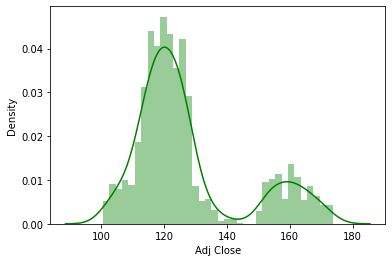

In [11]:
# Affichons la distrubutions de la variable
sns.distplot(df['Adj Close'], color='green')

In [12]:
fig = px.line(df, y='Adj Close', title = 'Visualisation de la target')
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

In [13]:
# Afin de mieux interprèter la variable cible, identifions le minimum, maximum ainsi que les différentes tendances.

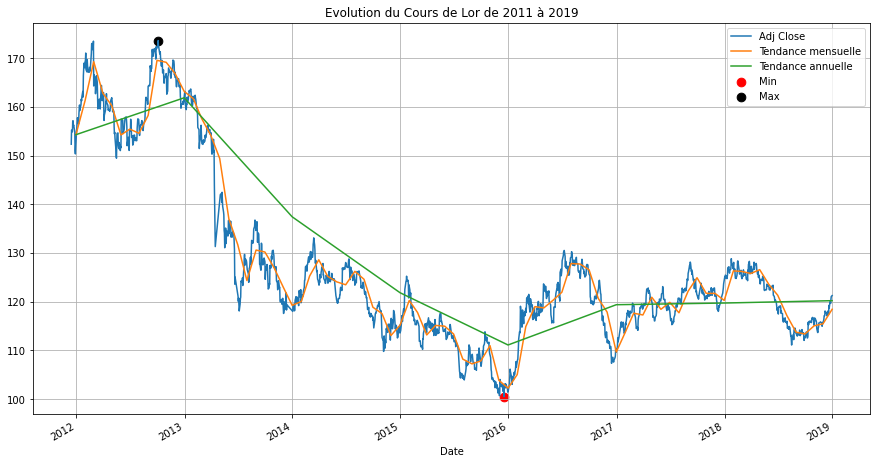

In [14]:
plt.figure(figsize=(15, 8)) 
plt.title('Evolution du Cours de Lor de 2011 à 2019') 
df['Adj Close'].plot()
plt.scatter(df['Adj Close'].idxmin(), df['Adj Close'].min(), marker='.', c='r', s=300, label="Min")
plt.scatter(df['Adj Close'].idxmax(), df['Adj Close'].max(), marker='.', c='black', s=300, label="Max") 
plt.plot(df['Adj Close'].resample('M').mean(), label='Tendance mensuelle') 
plt.plot(df['Adj Close'].resample('Y').mean(), label='Tendance annuelle')     
plt.legend() 
plt.grid()

In [15]:
# Quelles sont les dates du prix minimal et maximal de l'Adj Close. 

In [16]:
print("Cours minimal de l'or: ", df['Adj Close'].min(), "\n", "Jour: ", df['Adj Close'].idxmin(), "\n\n")
print("Cours maximal de l'or: ", df['Adj Close'].max(), "\n", "Jour: ", df['Adj Close'].idxmax())

Cours minimal de l'or:  100.5 
 Jour:  2015-12-17 00:00:00 


Cours maximal de l'or:  173.610001 
 Jour:  2012-10-04 00:00:00


## f.Compréhension des différentes variables

In [17]:
# Pour la compréhension des variables, affichons les 

In [18]:
#data = df.drop(['Adj Close'], axis=1)

In [19]:
def Vis_Graph(df, title):
    fig = px.line(title = title)
    for i in df.columns:
        fig.add_scatter(x=df.index, y=df[i], name=i)
        #fig.update_xaxes(rangeslider_visible=True)
    fig.show()

In [20]:
Vis_Graph(df,"Visualisation features/Target")

### g. Visualisation des relations : features/target

#### Pour une meilleur visualisation des rélations des features avec la target, vérifions la corrélation qui existent entre eux.

In [21]:
cor_targ = df.corr()

In [22]:
# Affichons les différentes valeurs de corrélation par ordre ascendant.
cor_targ['Adj Close'].sort_values(ascending=True)

USDI_Low        -0.722078
USDI_Price      -0.721569
USDI_Open       -0.720140
USDI_High       -0.720023
SP_high         -0.684904
SP_open         -0.684618
SP_close        -0.684284
SP_low          -0.683750
SP_Ajclose      -0.666071
DJ_open         -0.588800
DJ_high         -0.588778
DJ_Ajclose      -0.588411
DJ_close        -0.588411
DJ_low          -0.588157
GDX_Volume      -0.514616
USB_High        -0.464116
USO_Volume      -0.456193
USB_Price       -0.441347
USB_Open        -0.440822
USB_Low         -0.417352
OF_Volume       -0.225436
PLD_High        -0.217490
PLD_Open        -0.216426
PLD_Low         -0.214919
PLD_Price       -0.213179
USDI_Volume     -0.205954
DJ_volume       -0.155526
EG_volume       -0.126586
USB_Trend       -0.025933
USDI_Trend      -0.016641
PLT_Trend        0.011355
EU_Trend         0.019913
PLD_Trend        0.026536
SF_Trend         0.028100
OF_Trend         0.048205
OS_Trend         0.059510
RHO_PRICE        0.095782
SP_volume        0.241949
Volume      

In [23]:
# for col in corr_lin_positif:
#     df.plot.scatter(x=col, y='Adj Close')
#     plt.title(f'Adj Close_ {col}')
#     plt.show()

#### Affichons tous ces chiffres sur un graphe pour une meilleure compréhension

In [24]:
# Suppression de la variable cible du dataset
X = df.drop(['Adj Close'],axis=1)

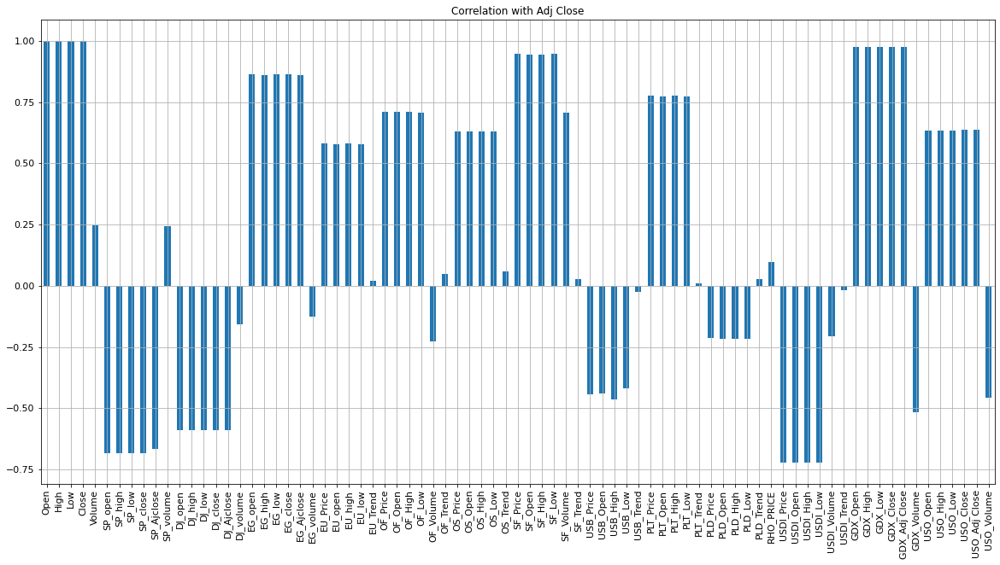

In [25]:
X.corrwith(df['Adj Close']).plot.bar(
        figsize = (20, 10), title = "Correlation with Adj Close", fontsize = 11,
        rot = 90, grid = True)
plt.savefig('Correlion_with_all_features.png', dpi=200)

In [26]:
corr_lin_positif = ['Close','High','Low','Open','GDX_Low','GDX_Close','GDX_High','GDX_Adj Close','GDX_Open','SF_Low','SF_Price','SF_Open','SF_High','EG_low',
'EG_open','EG_close','EG_high','EG_Ajclose']
corr_lin_positif = pd.DataFrame([corr_lin_positif])

In [27]:
corr_lin_neg = ['USDI_Low','USDI_Price','USDI_Open','USDI_High','SP_high','SP_open','SP_close','SP_low','SP_Ajclose']

In [28]:
corr_log = ['USB_Trend','USDI_Trend','PLT_Trend','EU_Trend','PLD_Trend','SF_Trend','OF_Trend','OS_Trend']

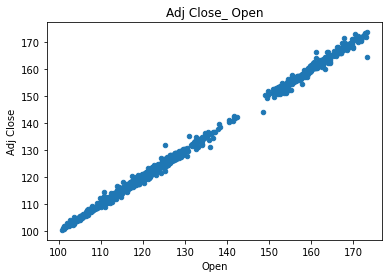

<Figure size 432x288 with 0 Axes>

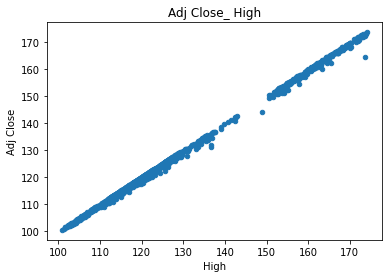

<Figure size 432x288 with 0 Axes>

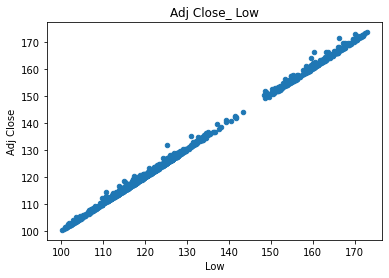

<Figure size 432x288 with 0 Axes>

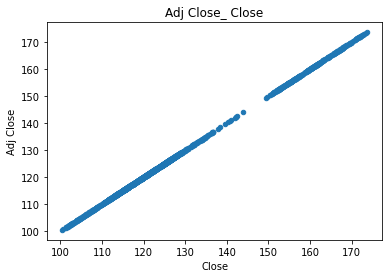

<Figure size 432x288 with 0 Axes>

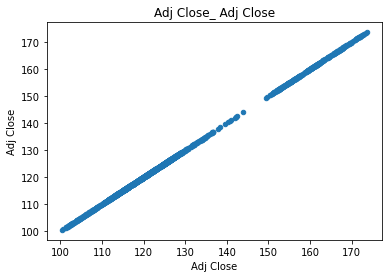

<Figure size 432x288 with 0 Axes>

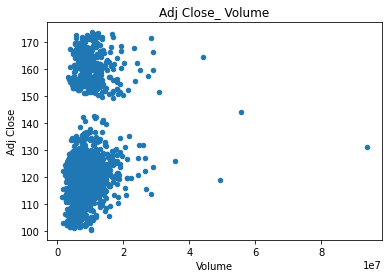

<Figure size 432x288 with 0 Axes>

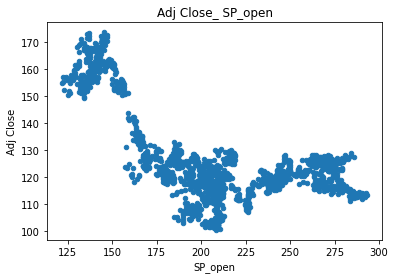

<Figure size 432x288 with 0 Axes>

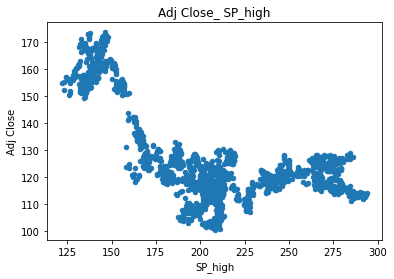

<Figure size 432x288 with 0 Axes>

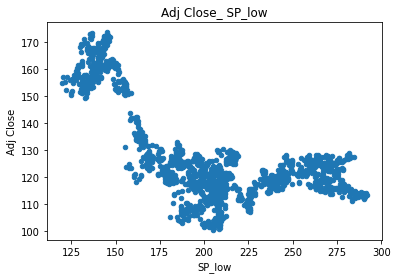

<Figure size 432x288 with 0 Axes>

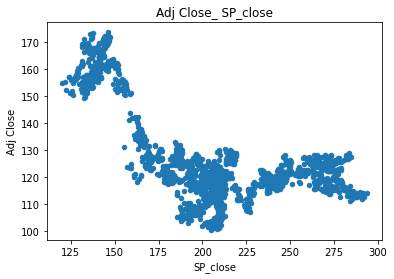

<Figure size 432x288 with 0 Axes>

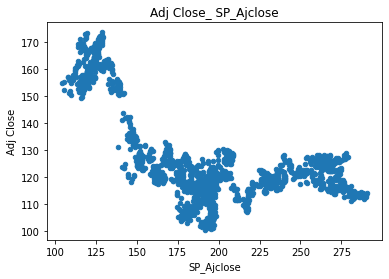

<Figure size 432x288 with 0 Axes>

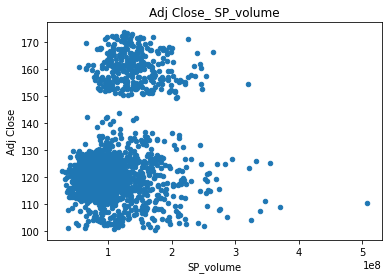

<Figure size 432x288 with 0 Axes>

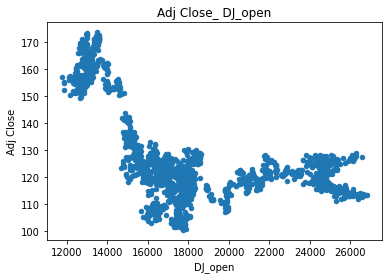

<Figure size 432x288 with 0 Axes>

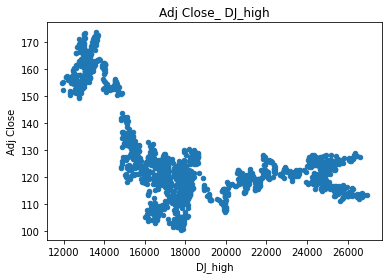

<Figure size 432x288 with 0 Axes>

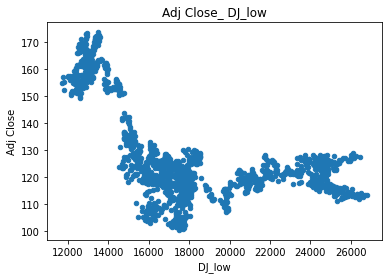

<Figure size 432x288 with 0 Axes>

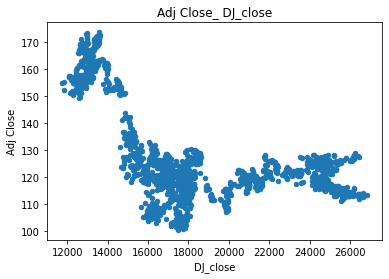

<Figure size 432x288 with 0 Axes>

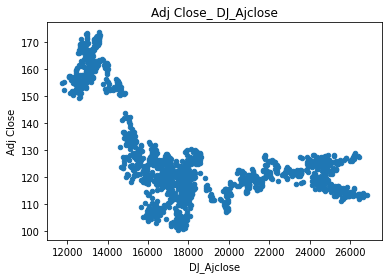

<Figure size 432x288 with 0 Axes>

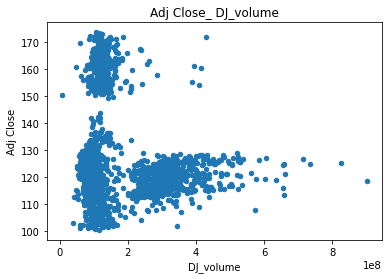

<Figure size 432x288 with 0 Axes>

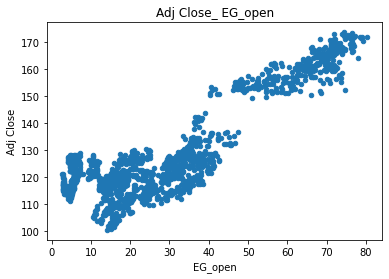

<Figure size 432x288 with 0 Axes>

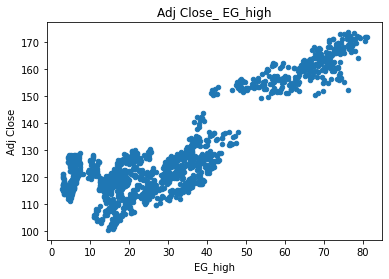

<Figure size 432x288 with 0 Axes>

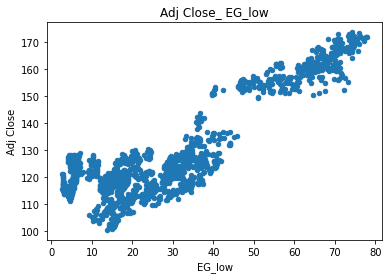

<Figure size 432x288 with 0 Axes>

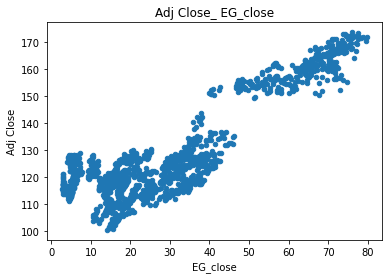

<Figure size 432x288 with 0 Axes>

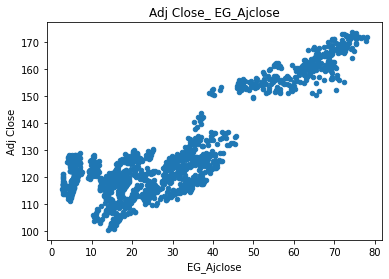

<Figure size 432x288 with 0 Axes>

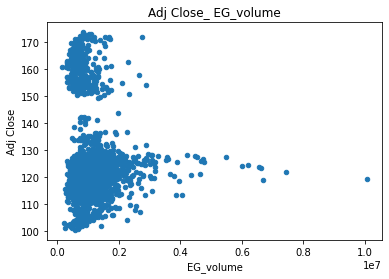

<Figure size 432x288 with 0 Axes>

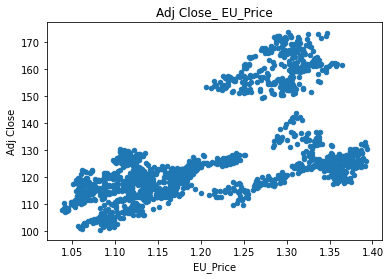

<Figure size 432x288 with 0 Axes>

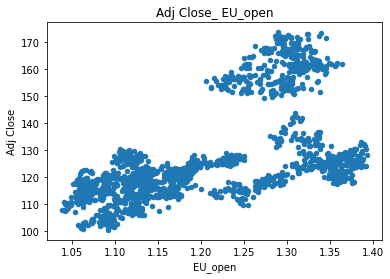

<Figure size 432x288 with 0 Axes>

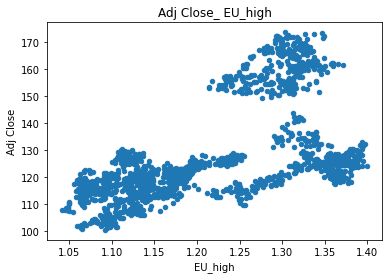

<Figure size 432x288 with 0 Axes>

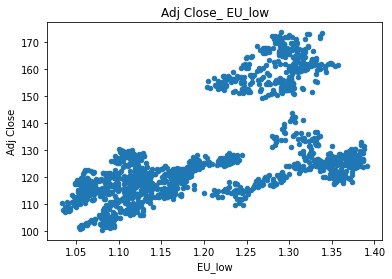

<Figure size 432x288 with 0 Axes>

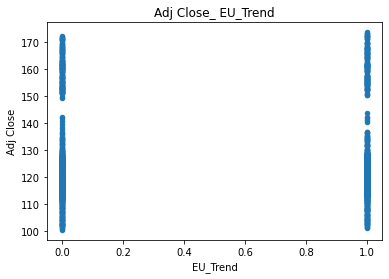

<Figure size 432x288 with 0 Axes>

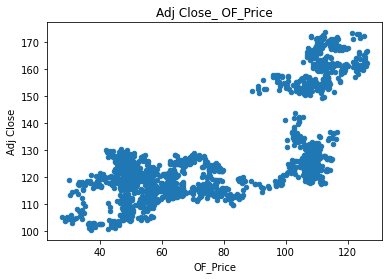

<Figure size 432x288 with 0 Axes>

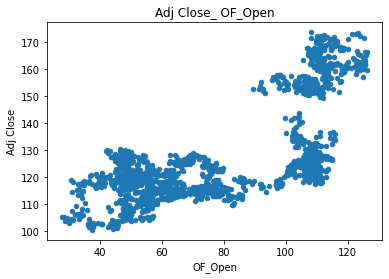

<Figure size 432x288 with 0 Axes>

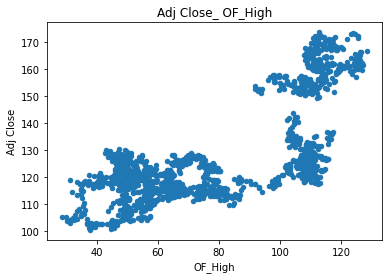

<Figure size 432x288 with 0 Axes>

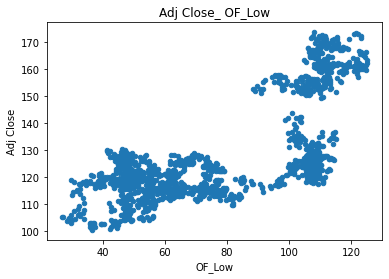

<Figure size 432x288 with 0 Axes>

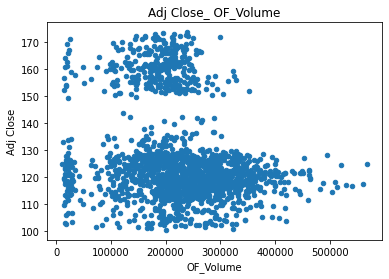

<Figure size 432x288 with 0 Axes>

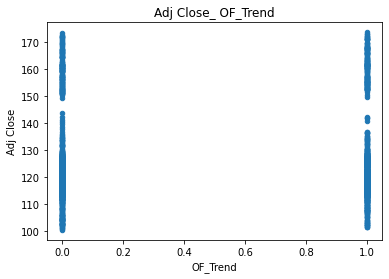

<Figure size 432x288 with 0 Axes>

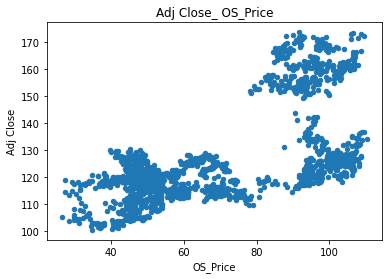

<Figure size 432x288 with 0 Axes>

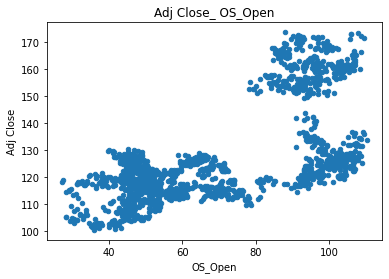

<Figure size 432x288 with 0 Axes>

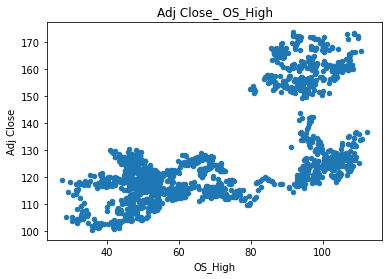

<Figure size 432x288 with 0 Axes>

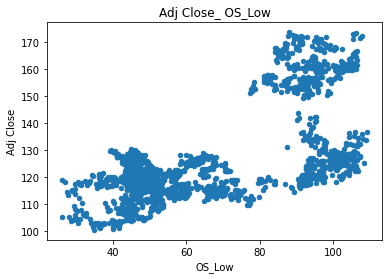

<Figure size 432x288 with 0 Axes>

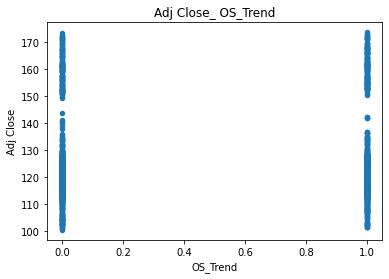

<Figure size 432x288 with 0 Axes>

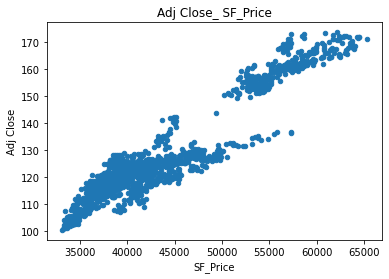

<Figure size 432x288 with 0 Axes>

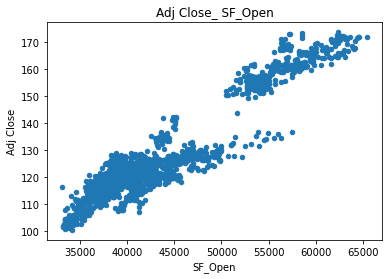

<Figure size 432x288 with 0 Axes>

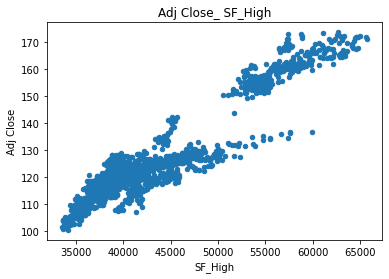

<Figure size 432x288 with 0 Axes>

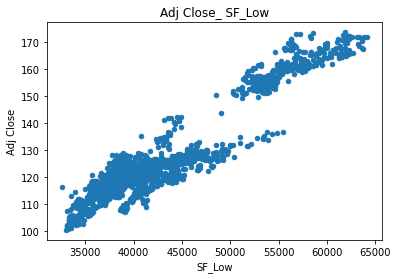

<Figure size 432x288 with 0 Axes>

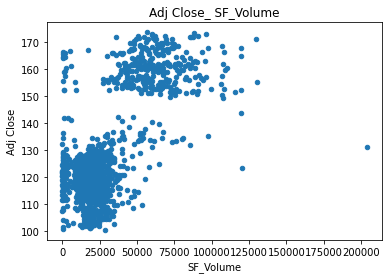

<Figure size 432x288 with 0 Axes>

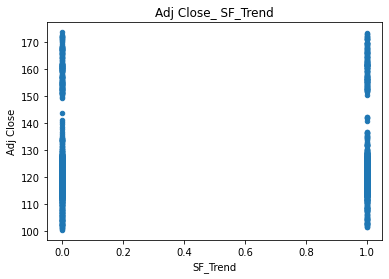

<Figure size 432x288 with 0 Axes>

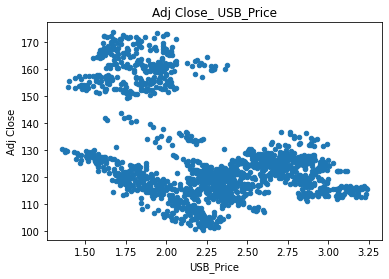

<Figure size 432x288 with 0 Axes>

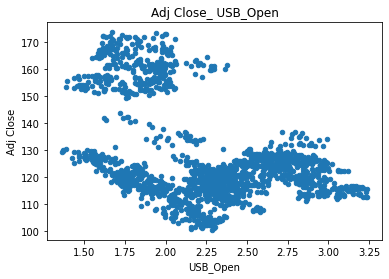

<Figure size 432x288 with 0 Axes>

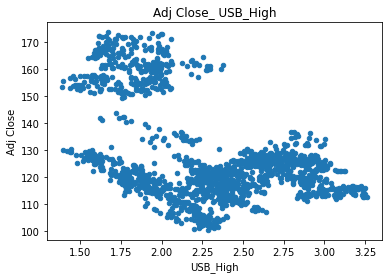

<Figure size 432x288 with 0 Axes>

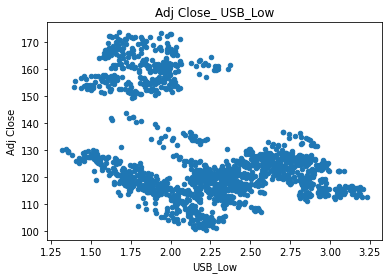

<Figure size 432x288 with 0 Axes>

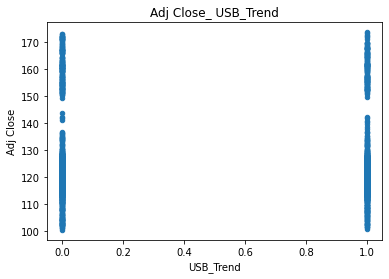

<Figure size 432x288 with 0 Axes>

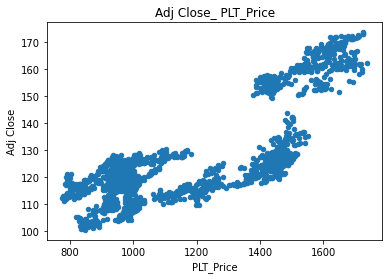

<Figure size 432x288 with 0 Axes>

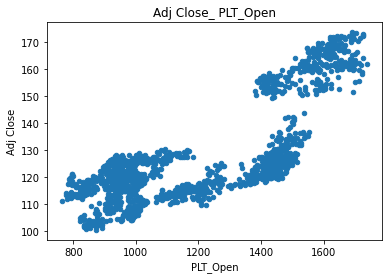

<Figure size 432x288 with 0 Axes>

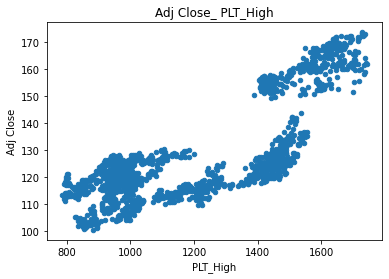

<Figure size 432x288 with 0 Axes>

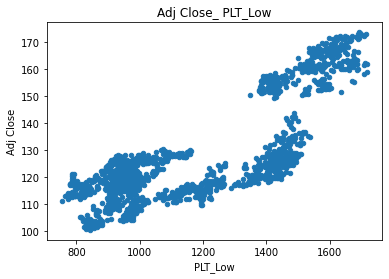

<Figure size 432x288 with 0 Axes>

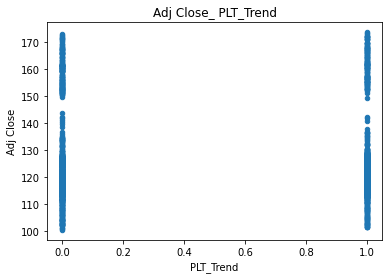

<Figure size 432x288 with 0 Axes>

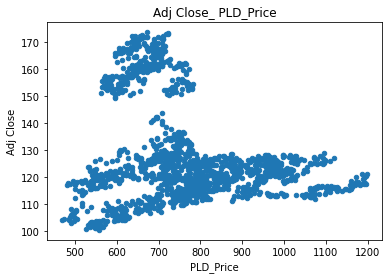

<Figure size 432x288 with 0 Axes>

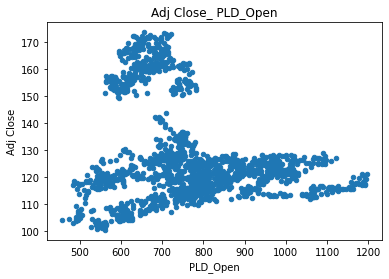

<Figure size 432x288 with 0 Axes>

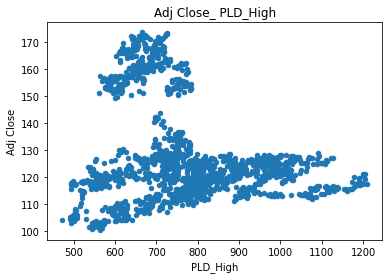

<Figure size 432x288 with 0 Axes>

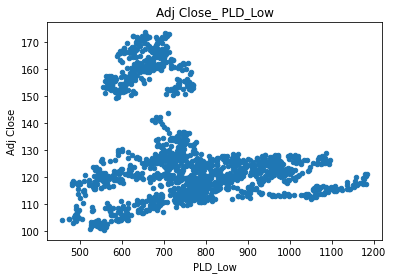

<Figure size 432x288 with 0 Axes>

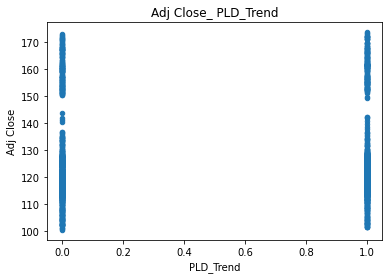

<Figure size 432x288 with 0 Axes>

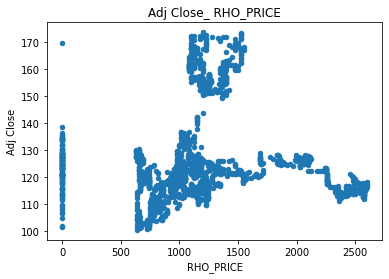

<Figure size 432x288 with 0 Axes>

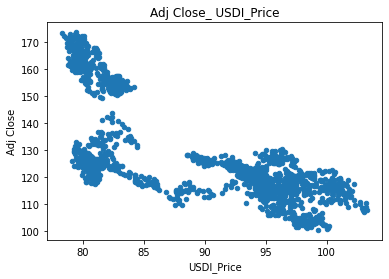

<Figure size 432x288 with 0 Axes>

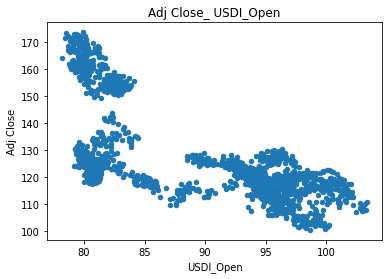

<Figure size 432x288 with 0 Axes>

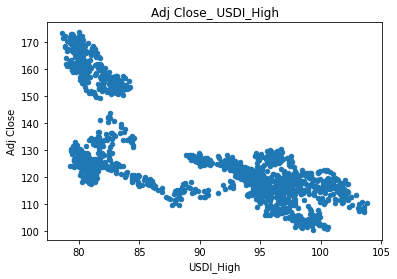

<Figure size 432x288 with 0 Axes>

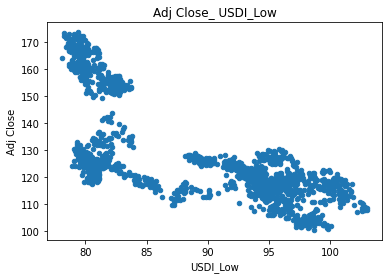

<Figure size 432x288 with 0 Axes>

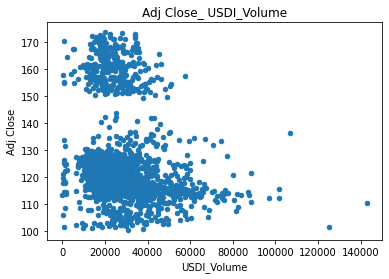

<Figure size 432x288 with 0 Axes>

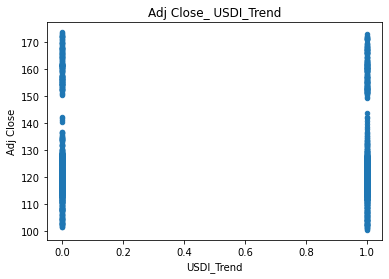

<Figure size 432x288 with 0 Axes>

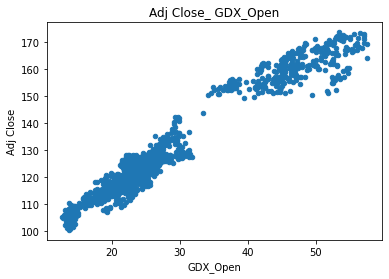

<Figure size 432x288 with 0 Axes>

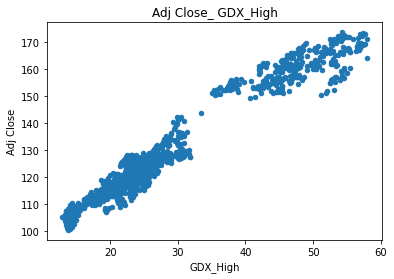

<Figure size 432x288 with 0 Axes>

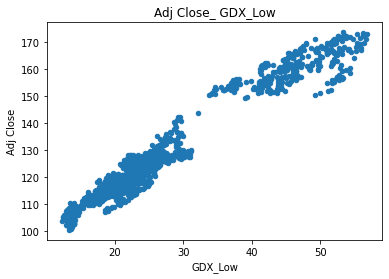

<Figure size 432x288 with 0 Axes>

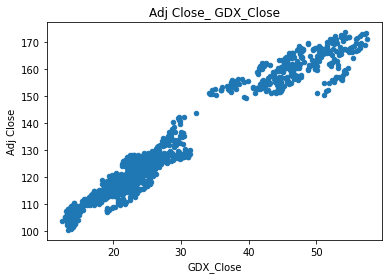

<Figure size 432x288 with 0 Axes>

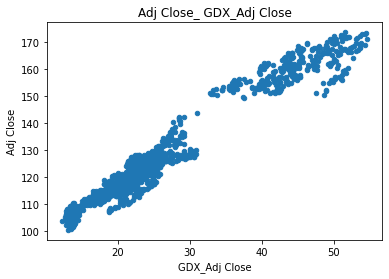

<Figure size 432x288 with 0 Axes>

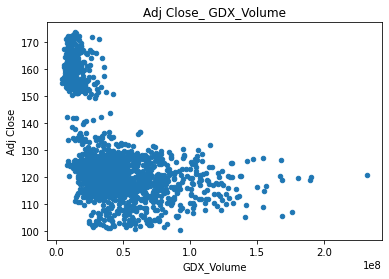

<Figure size 432x288 with 0 Axes>

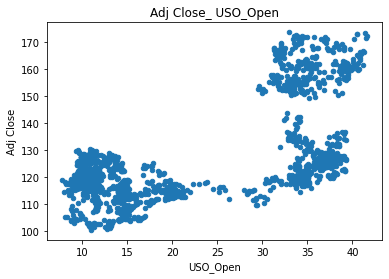

<Figure size 432x288 with 0 Axes>

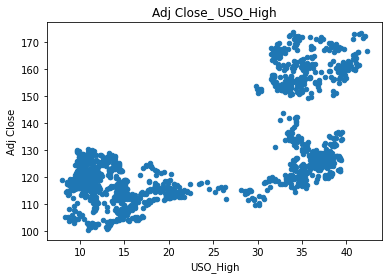

<Figure size 432x288 with 0 Axes>

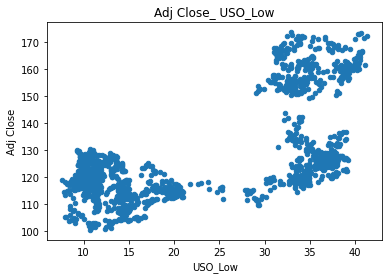

<Figure size 432x288 with 0 Axes>

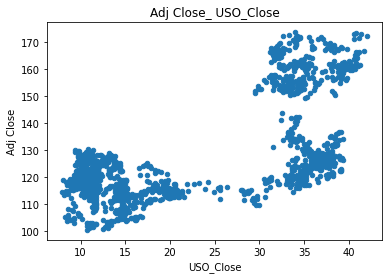

<Figure size 432x288 with 0 Axes>

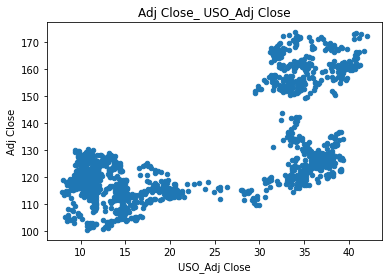

<Figure size 432x288 with 0 Axes>

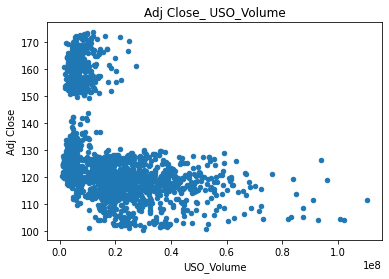

<Figure size 432x288 with 0 Axes>

In [29]:
for col in df.columns:
    df.plot.scatter(x=col, y='Adj Close')
    plt.title(f'Adj Close_ {col}')
    plt.show()
    plt.savefig(f'Correlion_with_{col}_target.png', dpi=200)

In [30]:
#df.plot.scatter(x='Close', y='High',c='Adj Close', colormap='viridis')
#plt.savefig('Correlion_with_Close_high_target.png', dpi=200)

### h. Identification des outliers

#### Fesons une visualisation des outliers

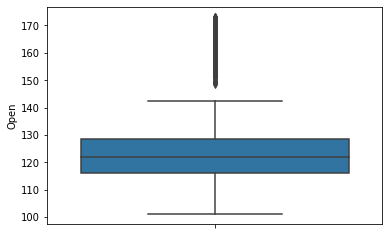

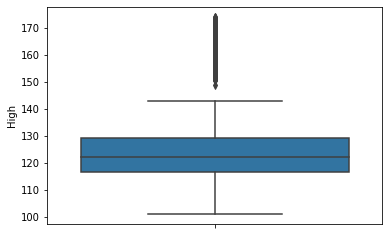

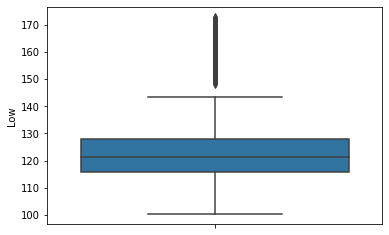

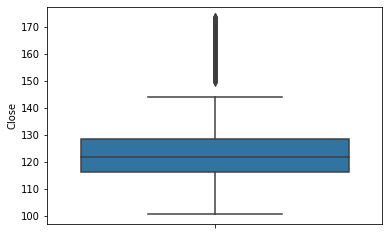

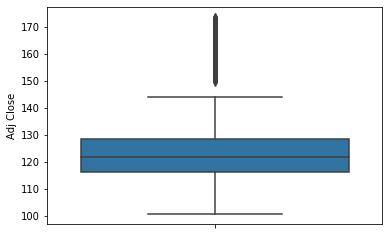

...

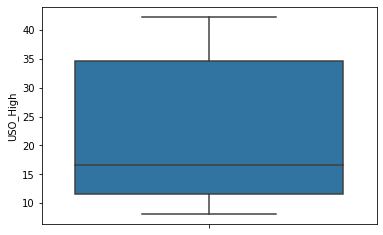

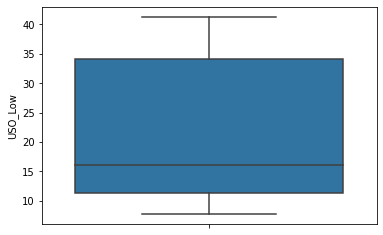

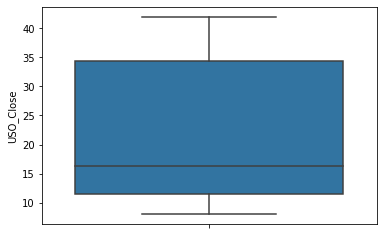

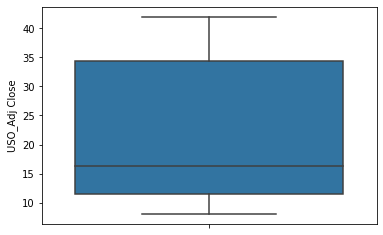

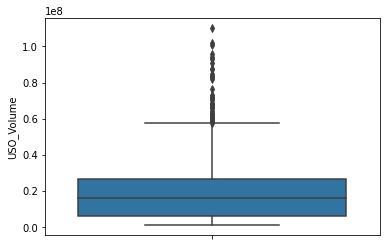

In [31]:
for i in df:
    sns.boxplot(y=df[f"{i}"], data=df)
    plt.savefig('Correlion_with_all_features.png', dpi=200)
    plt.show()

#### On remarque qu'il y a des valeurs abérantes dans les features suivantes : Open, High,Low, Close, Adj Close, Volume, SP_Volume,Dj_volume, EG_open, EG_high, EG_low, EG_close, EG_Adjclose, EG_volume, OF_Volume, SF_Price, SF_open, SF_High, SF_low, SF_Volume, PLD_Price, PLD_Open, PLD_High, PLD_low, RHO_price, USDI_Volume, GDX_Open,GDX_high, GDX_low, GDX_Close, GDX_Adj Close, GDX_Volume, USO_Volume.

In [32]:
Col_aber = ['Open','High','Low','Close','Adj Close','Volume','SP_volume','DJ_volume',
'EG_open','EG_high','EG_low','EG_close','EG_Ajclose','EG_volume','OF_Volume','SF_Price',
'SF_Open','SF_High','SF_Low','SF_Volume','PLD_Price','PLD_Open','PLD_High','PLD_Low',
'RHO_PRICE','USDI_Volume','GDX_Open','GDX_High','GDX_Low','GDX_Close','GDX_Adj Close',
'GDX_Volume','USO_Volume']

#### Vérifions maintenant le pourcentage des valeurs aberrantes dans les variables concernées

In [33]:
def valeurAberante(data):
    percentage = {}
    for col in data:
        Q1 = np.quantile(data[col],0.25)
        Q3 = np.quantile(data[col],0.75)
        IIQ = Q3 - Q1
        bornInf = Q1-1.5*IIQ
        bornSup = Q3+1.5*IIQ
        abberantVal = []
        for i in df[col]:
            if bornInf <= i <= bornSup :
                pass
            else:
                abberantVal.append(i)
                percent = len(abberantVal)*100/1718
                percentage[col] = percent
    return percentage

In [34]:
Valeur = valeurAberante(df)
Valeur

{'Open': 18.975552968568103,
 'High': 18.975552968568103,
 'Low': 18.917345750873107,
 'Close': 18.917345750873107,
 'Adj Close': 18.917345750873107,
 'Volume': 3.783469150174622,
 'SP_volume': 2.4447031431897557,
 'DJ_volume': 1.4551804423748544,
 'EG_open': 4.307334109429569,
 'EG_high': 4.2491268917345755,
 'EG_low': 4.074505238649593,
 'EG_close': 3.89988358556461,
 'EG_Ajclose': 2.9685681024447033,
 'EG_volume': 5.064027939464494,
 'OF_Volume': 2.3864959254947613,
 'SF_Price': 4.2491268917345755,
 'SF_Open': 3.958090803259604,
 'SF_High': 3.608847497089639,
 'SF_Low': 4.190919674039581,
 'SF_Volume': 13.620488940628638,
 'PLD_Price': 1.6880093131548313,
 'PLD_Open': 1.6880093131548313,
 'PLD_High': 1.6880093131548313,
 'PLD_Low': 1.5133876600698486,
 'RHO_PRICE': 16.82188591385332,
 'USDI_Volume': 4.481955762514552,
 'GDX_Open': 17.57857974388824,
 'GDX_High': 17.69499417927823,
 'GDX_Low': 18.21885913853318,
 'GDX_Close': 17.81140861466822,
 'GDX_Adj Close': 17.81140861466822,
 '

*********************************************************************************************************

# 2. Prédiction du prix de l’or

#### 2.1. Prédiction avec un modèle de régression linaire sans tenir compte de la date

In [35]:
# Copie de la dataset 
Data = df.copy()

In [36]:
# Après l'analyse exploratoire listons les variables qui influent sur la variable cible.

Features=[]
for index in ['SP_','EG_','OF_','OS_','SF_','PLT_','PLD_','USDI_','GDX_','USO_']:   
    for value in ['open','high','low','close','Ajclose','price','trend','Open','High','Low','Close','ajclose','Price','PRICE']:
        var = index+value
        if var in Data.columns.drop('Adj Close'):
            Features.append(var)
            
Dataframes = pd.concat([Data[['Open', 'High', 'Low', 'Close', 'Adj Close']],Data[Features]], axis=1)            
Dataframes            

,Open,High,Low,Close,Adj Close,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,OF_Open,OF_High,OF_Low,OF_Price,OS_Open,OS_High,OS_Low,OS_Price,SF_Open,SF_High,SF_Low,SF_Price,PLT_Open,PLT_High,PLT_Low,PLT_Price,PLD_Open,PLD_High,PLD_Low,PLD_Price,USDI_Open,USDI_High,USDI_Low,USDI_Price,GDX_Open,GDX_High,GDX_Low,GDX_Close,USO_Open,USO_High,USO_Low,USO_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,123.029999,123.199997,121.989998,122.180000,105.441238,74.550003,76.150002,72.150002,72.900002,70.431755,104.88,106.50,104.88,105.09,94.91,96.00,93.33,93.42,54248,54248,52316,53604,1420.30,1423.35,1376.85,1414.65,614.70,615.00,614.60,618.85,80.565,80.630,80.130,80.341,53.009998,53.139999,51.570000,51.680000,36.900002,36.939999,36.049999,36.130001
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,122.230003,122.949997,121.300003,121.589996,105.597549,73.599998,75.099998,73.349998,74.900002,72.364037,103.51,104.56,102.46,103.35,93.43,94.80,92.53,93.79,53650,54030,52890,53458,1414.75,1431.75,1400.70,1420.25,622.60,623.45,622.30,623.65,80.175,80.395,79.935,80.249,52.500000,53.180000,52.040001,52.680000,36.180000,36.500000,35.730000,36.270000
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,122.059998,122.320000,120.029999,120.290001,104.468536,69.099998,69.800003,64.199997,64.699997,62.509384,103.63,104.57,102.37,103.64,93.77,94.43,92.55,94.09,53400,53400,52544,52961,1422.65,1427.60,1404.60,1411.10,626.00,630.00,608.60,608.80,80.300,80.470,80.125,80.207,52.490002,52.549999,51.029999,51.169998,36.389999,36.450001,35.930000,36.200001
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,122.180000,124.139999,120.370003,123.930000,107.629784,66.449997,68.099998,66.000000,67.000000,64.731514,104.30,107.27,103.91,106.73,96.39,99.70,96.39,95.55,52795,53575,52595,53487,1408.95,1436.55,1408.15,1434.75,622.45,622.45,622.45,626.65,80.890,80.940,80.035,80.273,52.380001,53.250000,52.369999,52.990002,37.299999,37.610001,37.220001,37.560001
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,123.930000,124.360001,122.750000,124.169998,107.838242,67.099998,69.400002,66.900002,68.500000,66.180725,107.15,108.17,106.16,107.71,97.54,99.26,96.81,99.01,53519,54184,52937,53148,1434.40,1453.75,1417.65,1429.05,625.70,641.50,623.80,635.90,80.105,80.445,79.550,80.350,53.150002,53.430000,52.419998,52.959999,37.669998,38.240002,37.520000,38.110001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,239.039993,240.839996,234.270004,234.339996,234.339996,2.950000,3.050000,2.900000,2.950000,2.950000,53.49,54.66,50.36,50.47,45.34,45.95,42.22,42.27,37325,37600,37305,37541,791.85,798.30,788.30,788.40,1163.40,1177.60,1157.90,1172.80,96.440,96.440,95.870,96.007,20.700001,21.110001,20.650000,21.090000,9.490000,9.520000,9.280000,9.290000
2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,235.970001,246.179993,233.759995,246.179993,246.179993,3.000000,3.050000,2.900000,3.000000,3.000000,50.84,55.29,49.93,54.47,43.09,46.78,42.34,46.39,37607,38489,37574,38253,788.75,804.30,788.75,799.25,1176.00,1191.00,1175.50,1190.10,96.100,96.650,96.020,96.568,21.350000,21.400000,20.530001,20.620001,9.250000,9.920000,9.230000,9.900000
2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,242.570007,248.289993,238.960007,248.070007,248.070007,2.950000,3.000000,2.900000,2.950000,2.950000,54.65,54.67,51.94,52.16,46.41,46.41,44.20,45.23,38274,38783,38081,38690,799.40,802.20,785.10,795.50,1190.05,1198.40,1181.50,1196.00,96.460,96.495,95.935,96.001,20.840000,21.000000,20.700001,20.969999,9.590000,9.650000,9.370000,9.620000


In [37]:
# Vérifions les dimensions
Dataframes.shape

(1718, 47)

In [38]:
# Découpe 
X = Dataframes.drop(['Adj Close'], axis=1)
y = Dataframes['Adj Close']

In [39]:
# Normalisation des features
Norm_RS = RobustScaler()
X_Norm= pd.DataFrame(Norm_RS.fit_transform(X),index=X.index.tolist(), columns = X.columns)
X_Norm

,Open,High,Low,Close,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,OF_Open,OF_High,OF_Low,OF_Price,OS_Open,OS_High,OS_Low,OS_Price,SF_Open,SF_High,SF_Low,SF_Price,PLT_Open,PLT_High,PLT_Low,PLT_Price,PLD_Open,PLD_High,PLD_Low,PLD_Price,USDI_Open,USDI_High,USDI_Low,USDI_Price,GDX_Open,GDX_High,GDX_Low,GDX_Close,USO_Open,USO_High,USO_Low,USO_Close
2011-12-15,2.688923,2.600120,2.507438,2.459030,-1.232212,-1.247154,-1.238396,-1.253525,-1.139031,2.254902,2.275751,2.219284,2.186652,2.112873,0.627073,0.642440,0.645827,0.629301,0.662408,0.666010,0.653230,0.633633,1.589343,1.527428,1.430416,1.528017,0.645816,0.629588,0.585002,0.634789,-0.726777,-0.748500,-0.698300,-0.699777,-0.837462,-0.843150,-0.851133,-0.851869,4.404418,4.366703,4.454793,4.251764,0.889131,0.876443,0.877247,0.859283
2011-12-16,2.653698,2.633593,2.688429,2.692571,-1.244170,-1.250899,-1.248761,-1.262398,-1.136966,2.213507,2.230687,2.272176,2.273467,2.197887,0.602379,0.607538,0.602225,0.597994,0.629805,0.639751,0.635560,0.641790,1.520070,1.502592,1.498401,1.510964,0.634689,0.646333,0.633064,0.646017,-0.683705,-0.702932,-0.656244,-0.673829,-0.863929,-0.858970,-0.864472,-0.858118,4.329281,4.372571,4.527746,4.400297,0.857826,0.857451,0.863218,0.865364
2011-12-19,2.749540,2.672645,2.726446,2.663579,-1.246711,-1.260336,-1.267838,-1.281949,-1.151881,2.017429,2.003219,1.868870,1.830711,1.764317,0.604542,0.607718,0.600604,0.603212,0.637295,0.631654,0.636002,0.648404,1.491109,1.430817,1.457420,1.452916,0.650528,0.638060,0.640923,0.627672,-0.665167,-0.667610,-0.731071,-0.754105,-0.855446,-0.853921,-0.851475,-0.860971,4.327808,4.280161,4.370974,4.176012,0.866957,0.855293,0.871986,0.862324
2011-12-20,2.859310,2.797769,2.909917,2.833501,-1.244918,-1.233074,-1.262731,-1.227206,-1.110117,1.901960,1.930258,1.948209,1.930548,1.862082,0.616619,0.656292,0.628350,0.658810,0.695010,0.746977,0.720817,0.680593,1.421025,1.450755,1.463461,1.514352,0.623061,0.655902,0.648077,0.675087,-0.684523,-0.708325,-0.655424,-0.657612,-0.815405,-0.822282,-0.857631,-0.856488,4.311601,4.382838,4.578968,4.446343,0.906522,0.905363,0.928540,0.921390
2011-12-21,2.872416,2.805739,2.872727,2.847997,-1.218759,-1.229778,-1.226979,-1.223597,-1.107363,1.930283,1.986052,1.987879,1.995659,1.925843,0.667988,0.672484,0.668889,0.676443,0.720344,0.737349,0.730094,0.756876,1.504894,1.520137,1.503968,1.474757,0.674085,0.690190,0.667221,0.663659,-0.666803,-0.605595,-0.648051,-0.607609,-0.868680,-0.855604,-0.890808,-0.851258,4.425045,4.409241,4.586729,4.441887,0.922609,0.932557,0.941692,0.945277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.192095,-0.174138,-0.148760,-0.142944,0.501868,0.514979,0.448250,0.433282,0.563876,-0.864924,-0.861588,-0.833058,-0.849702,-0.856088,-0.299207,-0.290186,-0.336471,-0.353470,-0.429563,-0.429236,-0.475649,-0.494075,-0.371040,-0.369240,-0.347507,-0.348118,-0.614139,-0.616431,-0.601023,-0.620755,2.264840,2.285406,2.269134,2.294750,0.239905,0.221138,0.225566,0.212144,-0.355801,-0.331500,-0.344587,-0.291868,-0.302609,-0.307111,-0.296361,-0.306406
2018-12-26,-0.106082,-0.105599,-0.148760,-0.171935,0.455979,0.594967,0.440589,0.611347,0.720296,-0.862745,-0.861588,-0.833058,-0.847531,-0.853888,-0.346972,-0.278852,-0.344219,-0.281499,-0.479128,-0.411073,-0.472998,-0.403241,-0.338372,-0.267958,-0.315646,-0.264958,-0.620354,-0.604470,-0.600116,-0.599003,2.333538,2.357668,2.365263,2.388269,0.216831,0.235274,0.235827,0.250246,-0.260037,-0.288962,-0.363213,-0.361678,-0.313044,-0.289846,-0.298553,-0.279913
2018-12-27,-0.110178,-0.113568,-0.101653,-0.098651,0.554634,0.626573,0.518702,0.639772,0.745265,-0.864924,-0.863734,-0.833058,-0.849702,-0.856088,-0.278298,-0.290006,-0.308004,-0.323062,-0.405992,-0.419170,-0.431916,-0.428816,-0.261106,-0.234463,-0.255596,-0.213917,-0.599003,-0.608657,-0.607471,-0.606521,2.410141,2.39

In [40]:
X_train,X_test,y_train,y_test = train_test_split(X_Norm,y, test_size=0.3,random_state=0)

In [41]:
print("X_train set : ", X_train.shape)
print("y_train set : ", y_train.shape)
print("X_test set : " , X_test.shape)
print("y_test set : ", y_test.shape)

X_train set :  (1202, 46)
y_train set :  (1202,)
X_test set :  (516, 46)
y_test set :  (516,)


In [42]:
# Création du modèle
Lin_Reg = LinearRegression()
Lin_Reg.fit(X_train,y_train)

LinearRegression()

In [43]:
y_train_pred = Lin_Reg.predict(X_train)
y_pred = Lin_Reg.predict(X_test)

In [44]:
print("Score du modèle (train):", Lin_Reg.score(X_train, y_train))
print("Score du modèle (test):", Lin_Reg.score(X_test, y_test))
#print("MAE :", median_absolute_error(y_test, y_pred))
print("MSE :", mean_squared_error(y_test, y_pred))
N, train_score, val_score = learning_curve(Lin_Reg, X_train, y_train,
                                                   cv=5, 
                                                   train_sizes=np.linspace(0.1, 1, 10))

Score du modèle (train): 1.0
Score du modèle (test): 1.0
MSE : 9.872380196812414e-27


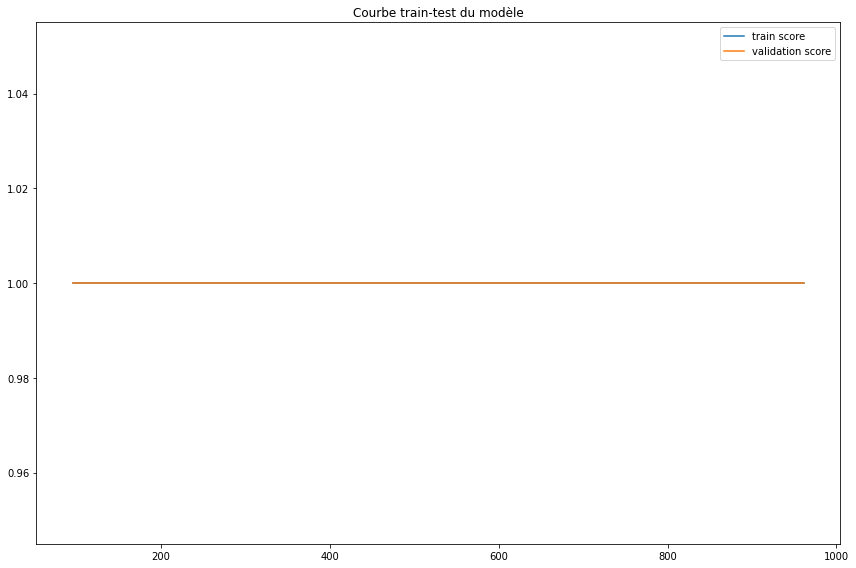

In [45]:
plt.figure(figsize=(12,8))
plt.title(f"Courbe train-test du modèle")
plt.plot(N, train_score.mean(axis=1), label='train score')
plt.plot(N, val_score.mean(axis=1), label='validation score')
plt.legend()
plt.tight_layout()        
plt.show()

In [46]:
# La régression Labsasso
Reg_Lasso = Lasso(5.)

In [47]:
Reg_Lasso.fit(X_train,y_train)

Lasso(alpha=5.0)

In [48]:
y_train_pred = Reg_Lasso.predict(X_train)
y_pred = Reg_Lasso.predict(X_test)

In [49]:
print("Score du modèle (train):", Reg_Lasso.score(X_train, y_train))
print("Score du modèle (test):", Reg_Lasso.score(X_test, y_test))
#print("MAE :", median_absolute_error(y_test, y_pred))
print("MSE :", mean_squared_error(y_test, y_pred))
N, train_score, val_score = learning_curve(Reg_Lasso, X_train, y_train,
                                                   cv=5, 
                                                   train_sizes=np.linspace(0.1, 1, 10))

Score du modèle (train): 0.9515844204365793
Score du modèle (test): 0.953827771612645
MSE : 14.76496798031794


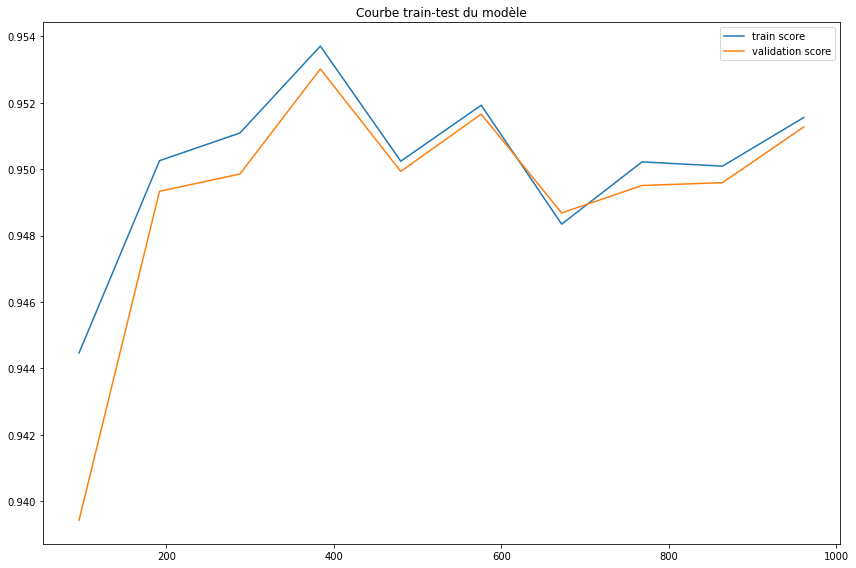

In [50]:
plt.figure(figsize=(12,8))
plt.title(f"Courbe train-test du modèle")
plt.plot(N, train_score.mean(axis=1), label='train score')
plt.plot(N, val_score.mean(axis=1), label='validation score')
plt.legend()
plt.tight_layout()        
plt.show()

### 2.2 Normalité de résidus

In [51]:
# Somme des résidus
y_pred_R = Lin_Reg.predict(X_train)
residues = y_train.values-y_pred_R
mean_residues = np.mean(residues)
print("Somme des Résidus : {}".format(mean_residues))

Somme des Résidus : -5.4384302570656586e-15


In [52]:
# Affichons le diagramme des résidus en fonction du modèle


C:\Users\HP\Anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning:

Dataset has 0 variance; skipping density estimate.



<Figure size 432x288 with 0 Axes>

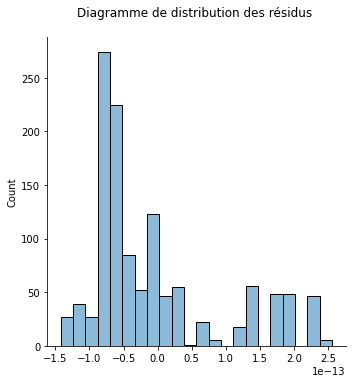

In [53]:
plt.figure()
sns.displot(data=residues, kde=True)
plt.title("Diagramme de distribution des résidus \n")
plt.show()

In [54]:
# Fesons le test de shapiro
Datas = residues
stat, p_value_sh = shapiro(Datas)
print(stat, p_value_sh)
if p_value_sh > 0.05:
    print("les residus suivents une Distribution Normal")
else:
    print("les residus ne suivents pas une Distribution Normal")

0.8237031698226929 2.191649983213133e-34
les residus ne suivents pas une Distribution Normal


In [55]:
# Fesons le test de levene
stat, p_value_lv = levene(y_pred_R,residues)

print("le test de levene :",stat, p_value_lv)

le test de levene : 935.0826669173533 9.814212606724488e-174


In [56]:
# Test de Kolmogorov-Smirov
p_value_ks = kstest(residues, 'norm')
print("Test de Kolmogorov-Smirov: ", p_value_ks[1])

Test de Kolmogorov-Smirov:  2.1379300373628077e-278


C:\Users\HP\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\HP\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



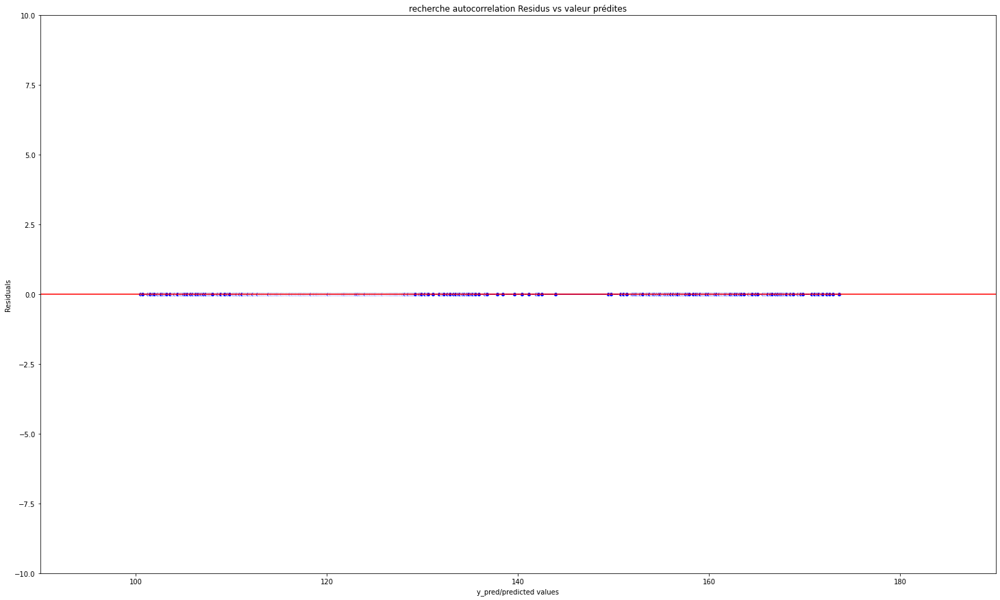

In [57]:
# Graphique d'autocorrélation
plt.figure(figsize=(25,15))
p = sns.lineplot(y_pred_R,residues,marker='o',color='blue')
plt.xlabel('y_pred/predicted values')
plt.ylabel('Residuals')
plt.ylim(-10,10)
plt.xlim(90,190)
p = sns.lineplot([90,190],[0,0],color='red')
p = plt.title('recherche autocorrelation Residus vs valeur prédites')

In [58]:
# Formulation finale 
# On en déduit qu'il y a de l'autocorrélation

### 2.3 Des alternatives au modèle de regression linéaire

In [59]:
#Ts = TimeSeriesSplit(n_splits = 6)
#X = data.drop(['Adj Close'], axis = 1)
#y = data['Adj Close']

In [60]:
#for train, test in Ts.split(X):
#    X_train, X_test = X.iloc[train, :], X.iloc[test,:]
#   y_train, y_test = y.iloc[train], y.iloc[test]

#### RandomForestRegressor

In [61]:
model_rf = RandomForestRegressor(n_estimators=50, random_state=0)
model_rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=50, random_state=0)

In [62]:
y_train_pred = model_rf.predict(X_train)
y_pred = model_rf.predict(X_test)

In [63]:
print("Score du modèle (train):", model_rf.score(X_train, y_train))
print("Score du modèle (test):", model_rf.score(X_test, y_test))
print("RMSE : {}".format(np.sqrt(mean_squared_error(y_test, y_pred))))
print("MSE :", mean_squared_error(y_test, y_pred))
N, train_score, val_score = learning_curve(model_rf, X_train, y_train,
                                                   cv=5, 
                                                   train_sizes=np.linspace(0.1, 1, 10))

Score du modèle (train): 0.999970480053545
Score du modèle (test): 0.9999375938448243
RMSE : 0.1412666187901502
MSE : 0.019956257584401622


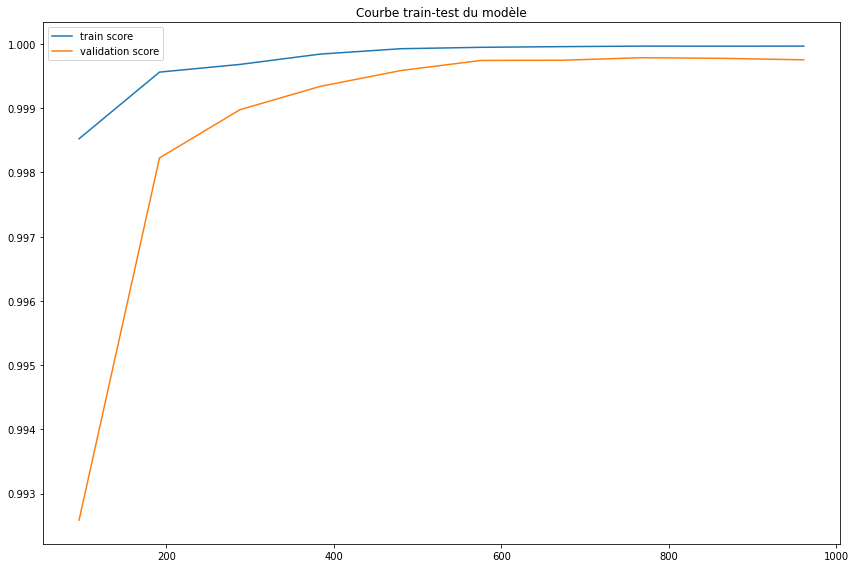

In [64]:
plt.figure(figsize=(12,8))
plt.title(f"Courbe train-test du modèle")
plt.plot(N, train_score.mean(axis=1), label='train score')
plt.plot(N, val_score.mean(axis=1), label='validation score')
plt.legend()
plt.tight_layout()        
plt.show()

***********************************************************************************

#### SVM

In [65]:
model_svm = SVR()
model_svm.fit(X_train, y_train)

SVR()

In [66]:
y_train_pred = model_svm.predict(X_train)
y_pred = model_svm.predict(X_test)

In [67]:
print("Score du modèle (train):", model_svm.score(X_train, y_train))
print("Score du modèle (test):", model_svm.score(X_test, y_test))
print("MSE :", mean_squared_error(y_test, y_pred))
print("RMSE : {}".format(np.sqrt(mean_squared_error(y_test, y_pred))))
N, train_score, val_score = learning_curve(model_svm, X_train, y_train,
                                                   cv=5, 
                                                   train_sizes=np.linspace(0.1, 1, 10))

Score du modèle (train): 0.9966512861431042
Score du modèle (test): 0.9960015372664762
MSE : 1.2786295202321514
RMSE : 1.1307650154794104


### 2.4 Prédiction en tenant compte du temps

In [68]:
# Copy du dataset
Dataframes

,Open,High,Low,Close,Adj Close,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,OF_Open,OF_High,OF_Low,OF_Price,OS_Open,OS_High,OS_Low,OS_Price,SF_Open,SF_High,SF_Low,SF_Price,PLT_Open,PLT_High,PLT_Low,PLT_Price,PLD_Open,PLD_High,PLD_Low,PLD_Price,USDI_Open,USDI_High,USDI_Low,USDI_Price,GDX_Open,GDX_High,GDX_Low,GDX_Close,USO_Open,USO_High,USO_Low,USO_Close
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,123.029999,123.199997,121.989998,122.180000,105.441238,74.550003,76.150002,72.150002,72.900002,70.431755,104.88,106.50,104.88,105.09,94.91,96.00,93.33,93.42,54248,54248,52316,53604,1420.30,1423.35,1376.85,1414.65,614.70,615.00,614.60,618.85,80.565,80.630,80.130,80.341,53.009998,53.139999,51.570000,51.680000,36.900002,36.939999,36.049999,36.130001
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,122.230003,122.949997,121.300003,121.589996,105.597549,73.599998,75.099998,73.349998,74.900002,72.364037,103.51,104.56,102.46,103.35,93.43,94.80,92.53,93.79,53650,54030,52890,53458,1414.75,1431.75,1400.70,1420.25,622.60,623.45,622.30,623.65,80.175,80.395,79.935,80.249,52.500000,53.180000,52.040001,52.680000,36.180000,36.500000,35.730000,36.270000
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,122.059998,122.320000,120.029999,120.290001,104.468536,69.099998,69.800003,64.199997,64.699997,62.509384,103.63,104.57,102.37,103.64,93.77,94.43,92.55,94.09,53400,53400,52544,52961,1422.65,1427.60,1404.60,1411.10,626.00,630.00,608.60,608.80,80.300,80.470,80.125,80.207,52.490002,52.549999,51.029999,51.169998,36.389999,36.450001,35.930000,36.200001
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,122.180000,124.139999,120.370003,123.930000,107.629784,66.449997,68.099998,66.000000,67.000000,64.731514,104.30,107.27,103.91,106.73,96.39,99.70,96.39,95.55,52795,53575,52595,53487,1408.95,1436.55,1408.15,1434.75,622.45,622.45,622.45,626.65,80.890,80.940,80.035,80.273,52.380001,53.250000,52.369999,52.990002,37.299999,37.610001,37.220001,37.560001
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,123.930000,124.360001,122.750000,124.169998,107.838242,67.099998,69.400002,66.900002,68.500000,66.180725,107.15,108.17,106.16,107.71,97.54,99.26,96.81,99.01,53519,54184,52937,53148,1434.40,1453.75,1417.65,1429.05,625.70,641.50,623.80,635.90,80.105,80.445,79.550,80.350,53.150002,53.430000,52.419998,52.959999,37.669998,38.240002,37.520000,38.110001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,239.039993,240.839996,234.270004,234.339996,234.339996,2.950000,3.050000,2.900000,2.950000,2.950000,53.49,54.66,50.36,50.47,45.34,45.95,42.22,42.27,37325,37600,37305,37541,791.85,798.30,788.30,788.40,1163.40,1177.60,1157.90,1172.80,96.440,96.440,95.870,96.007,20.700001,21.110001,20.650000,21.090000,9.490000,9.520000,9.280000,9.290000
2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,235.970001,246.179993,233.759995,246.179993,246.179993,3.000000,3.050000,2.900000,3.000000,3.000000,50.84,55.29,49.93,54.47,43.09,46.78,42.34,46.39,37607,38489,37574,38253,788.75,804.30,788.75,799.25,1176.00,1191.00,1175.50,1190.10,96.100,96.650,96.020,96.568,21.350000,21.400000,20.530001,20.620001,9.250000,9.920000,9.230000,9.900000
2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,242.570007,248.289993,238.960007,248.070007,248.070007,2.950000,3.000000,2.900000,2.950000,2.950000,54.65,54.67,51.94,52.16,46.41,46.41,44.20,45.23,38274,38783,38081,38690,799.40,802.20,785.10,795.50,1190.05,1198.40,1181.50,1196.00,96.460,96.495,95.935,96.001,20.840000,21.000000,20.700001,20.969999,9.590000,9.650000,9.370000,9.620000


In [79]:
# Découpe du dataset
training_size=int(len(Dataframes)*0.8)
test_size=len(Dataframes)-training_size

In [80]:
training_size

1374

In [81]:
test_size

344

In [82]:
train_data,test_data=Dataframes[0:training_size,:],Dataframes[training_size:len(Dataframes),:1]

TypeError: '(slice(0, 1374, None), slice(None, None, None))' is an invalid key

In [ ]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-time_step-1):
		a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
		dataX.append(a)
		dataY.append(dataset[i + time_step, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [ ]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 100
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)

In [ ]:
print(X_train.shape), print(y_train.shape)

In [ ]:
print(X_test.shape), print(ytest.shape)

In [ ]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

In [ ]:
### Create the Stacked LSTM model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM

In [ ]:
model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')

In [ ]:
model.summary()

In [ ]:
model.summary()

In [ ]:
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=64,verbose=1)

In [ ]:
# demonstrate prediction for next 10 days
from numpy import array

lst_output=[]
n_steps=100
i=0
while(i<30):
    
    if(len(temp_input)>100):
        #print(temp_input)
        x_input=np.array(temp_input[1:])
        print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        #print(x_input)
        yhat = model.predict(x_input, verbose=0)
        print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
        lst_output.extend(yhat.tolist())
        i=i+1
    else:
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        print(yhat[0])
        temp_input.extend(yhat[0].tolist())
        print(len(temp_input))
        lst_output.extend(yhat.tolist())
        i=i+1
    

print(lst_output)

In [ ]:
day_new=np.arange(1,101)
day_pred=np.arange(101,131)

In [ ]:
len(df1)

In [ ]:
plt.plot(day_new,scaler.inverse_transform(df1[1158:]))
plt.plot(day_pred,scaler.inverse_transform(lst_output))

In [ ]:
df3=df1.tolist()
df3.extend(lst_output)
plt.plot(df3[1200:])

In [ ]:
df3=scaler.inverse_transform(df3).tolist()

In [ ]:
plt.plot(df3)